In [9]:
@time using OrdinaryDiffEq
@time using Plots
@time using Sundials
@time using LSODA
@time using Printf
@time gr()

  2.863194 seconds (5.68 M allocations: 408.793 MiB, 1.78% gc time)
  5.222912 seconds (7.67 M allocations: 522.718 MiB, 5.92% gc time)
  0.437592 seconds (190.87 k allocations: 13.269 MiB)
  0.033675 seconds (35.08 k allocations: 2.353 MiB)
  0.000185 seconds (108 allocations: 7.531 KiB)
  0.004677 seconds (1.59 k allocations: 107.179 KiB, 98.72% compilation time)


Plots.GRBackend()

In [2]:
# first lets build a wrapper

function allocate_memory(nz,nq,np,nsp,nr,ks,kj)
    ccall((:__photochem_MOD_allocate_memory, "./Photochem_jl.so"), Cvoid,
        (Ref{Int32}, Ref{Int32},Ref{Int32},Ref{Int32},Ref{Int32},Ref{Int32},Ref{Int32})
        ,nz, nq, np, nsp, nr, ks, kj)
    nothing
end;

function setup(species_dat,reactions_rx,planet_dat,photochem_dat, atmosphere_txt, flux_txt)
    ccall((:__photochem_MOD_setup, "./Photochem_jl.so"), Cvoid,
        (Ptr{UInt8},Ptr{UInt8},Ptr{UInt8},Ptr{UInt8},Ptr{UInt8},Ptr{UInt8},
         Csize_t,Csize_t,Csize_t,Csize_t,Csize_t,Csize_t)
        ,species_dat,reactions_rx,planet_dat,photochem_dat, atmosphere_txt, flux_txt
        ,sizeof(species_dat),sizeof(reactions_rx),sizeof(planet_dat),sizeof(photochem_dat),sizeof(atmosphere_txt),sizeof(flux_txt))
    nothing
end;

function integrate(nsteps)
    converged = ones(Int32,1)
    ccall((:__photochem_MOD_integrate, "./Photochem_jl.so"), Cvoid,
        (Ref{Int32}, Ref{Int32})
        ,nsteps, converged)
    return converged[1]
end;

function rhs!(dfdt,f,p,t)
#     print("\r"*@sprintf("%.5E", t))
    ccall((:__photochem_MOD_right_hand_side, "./Photochem_jl.so"), 
        Cvoid,(Ref{Float64},Ref{Float64},Ref{Int32}),f,dfdt,length(f))
    nothing 
end


function residual!(res,y)
    rhs!(res,y,0.0,0.0)
    nothing
end


function residual_log!(res,y_log)
    println(y_log[1])
    rhs!(res,10.0.^y_log,0.0,0.0)
    nothing
end


# function jacobian!(jac,f,p,t)
#     ccall((:__photochem_MOD_jacobian, "./Photochem_jl.so"), 
#         Cvoid,(Ref{Float64},Ref{Float64},Ref{Int32},Ref{Int32}),f,jac,size(jac,2),size(jac,1))
#     nothing 
# end

function jacobian!(J::BandedMatrix{Float64},f,p,t)
    jac = similar(J.data)
    ccall((:__photochem_MOD_jacobian, "./Photochem_jl.so"), 
        Cvoid,(Ref{Float64},Ref{Float64},Ref{Int32},Ref{Int32}),f,jac,size(jac,2),size(jac,1))
#     J = BandedMatrix(Zeros(size(jac,2),size(jac,2)),(61,61))
    J.data = jac
    nothing
end

function jacobian_log!(J::BandedMatrix{Float64},f_log)
    jacobian!(J,10.0.^f_log,0.0,0.0)
    nothing
end


jacobian_log! (generic function with 1 method)

In [1]:
function setup(rxs, settings, flux, atmosphere, err)
    ccall((:__photochem_setup_MOD_setup, "./src/photochem_jl.so"), Cvoid,
        (Ptr{UInt8},Ptr{UInt8},Ptr{UInt8},Ptr{UInt8},Ptr{UInt8},
         Csize_t,Csize_t,Csize_t,Csize_t,Csize_t)
        ,rxs, settings, flux, atmosphere, err
        ,sizeof(rxs),sizeof(settings),sizeof(flux),sizeof(atmosphere), 1024)
    nothing
end;

In [2]:
err = ""
for i = 1:1024
   err = err*" "
end
setup("zahnle_titan.yaml","settings.yaml","Sun_4.0Ga.txt","atmosphere_nothing.txt",err)

In [3]:
nq = 78
nz = 200
usol_init = Array{Float64,2}(undef,(nq,nz))
ccall((:__photochem_MOD_get_usol_init, "./src/photochem_jl.so"), Cvoid,
     (Ref{Float64},)
        ,usol_init)

In [4]:
using FiniteDiff
using ArrayInterface
using LinearAlgebra, BandedMatrices

In [5]:
function rhs11(dfdt,f)
    err = ""
    for i = 1:1024
       err = err*" "
    end
    ccall((:__photochem_MOD_rhs_background_gas, "./src/photochem_jl.so"), 
        Cvoid,(Ref{Int32},Ref{Float64},Ref{Float64},Ptr{UInt8},Csize_t,),
        length(f),f,dfdt,err,1024)
    nothing 
end

rhs11 (generic function with 1 method)

In [7]:
f = vec(usol_init)
dfdt = similar(f)
t = 0.0
p = 0.0;
@time rhs11(dfdt,f)

  0.013859 seconds (1.02 k allocations: 555.281 KiB)


In [8]:
J = BandedMatrix(zeros(nz*nq,nz*nq),(nq,nq));
colorsbbb = ArrayInterface.matrix_colors(J);
bbbcache = FiniteDiff.JacobianCache(f,colorvec=colorsbbb,sparsity=J);

In [9]:
FiniteDiff.finite_difference_jacobian!(J, rhs11, f, bbbcache)

In [10]:
j = nq+nq+1
for i in 1:nq+nq+1
     println(J.data[i,1], "  ")
end

0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
0.0  
-0.23305471518042312  
0.16103151785599307  
-1.1770032415370224e-7  
1.1771149153804039e-7  
-6.139348527567792e-10  
7.543886072125558e-32  
-6.027299097759253e-10  
6.027676136000082e-10  
-5.589518166259893e-31  
1.6530254495042129e-31  
-7.414381512596134e-33  
1.3217255027631145e-31  
-4.005830179607006e-32  
0.08904736337445623  
-0.0890473631726536  
7.14837267702392e-32  
2.090211898139381e-32  
0.0  
-2.0902118981398357e-32  
-4.176194859519056e-53  
4.983432122130752e-32  
-5.022747812332469e-32  
3.895433631361057e

In [12]:
78+78+1


157

In [3]:
nz = 200
nq = 61
np = 4
nsp = 74 
nr = 392
ks = 33
kj = 60
allocate_memory(nz,nq,np,nsp,nr,ks,kj)

setup("input/templates/Archean+haze/species.dat", 
       "input/templates/Archean+haze/reactions.rx", 
       "input/templates/Archean+haze/PLANET.dat", 
       "input/templates/Archean+haze/input_photchem.dat", 
       "input/templates/Archean+haze/atmosphere.txt", 
       "input/templates/Archean+haze/Sun_2.7Ga.txt")

In [3]:
nz = 200
nq = 69
np = 4
nsp = 86 
nr = 477
ks = 37
kj = 64
allocate_memory(nz,nq,np,nsp,nr,ks,kj)

setup("input/templates/Hadean+HCN/species.dat", 
       "input/templates/Hadean+HCN/reactions.rx", 
       "input/templates/Hadean+HCN/PLANET.dat", 
       "input/templates/Hadean+HCN/input_photchem.dat", 
       "input/templates/Hadean+HCN/atmosphere.txt", 
       "input/templates/Hadean+HCN/Sun_4.0Ga.txt")

In [4]:


# a = cglobal((:__photochem_MOD_fixed_particle_size, "./Photochem_jl.so"), Bool)
# unsafe_store!(a,true)

In [30]:
a = cglobal((:__photochem_MOD_epsj, "./Photochem_jl.so"), Float64)
unsafe_store!(a,1.0e-9)

Ptr{Float64} @0x00000001715c3690

In [31]:
unsafe_load(a)

1.0e-9

In [5]:
# integrate(1000)

In [5]:
usol_init = Array{Float64,2}(undef,(nq,nz))
ccall((:__photochem_MOD_get_usol_init, "./Photochem_jl.so"), Cvoid,
     (Ref{Float64},)
        ,usol_init)

In [6]:
f = vec(usol_init)
dfdt = similar(f)
t = 0.0
p = 0.0;
@time rhs!(dfdt,f,p,t)

  0.051690 seconds (33.53 k allocations: 2.083 MiB, 20.46% compilation time)


In [7]:
using FiniteDiff
using ArrayInterface

In [8]:
function rhs11(dfdt,f)
    ccall((:__photochem_MOD_right_hand_side, "./Photochem_jl.so"), 
        Cvoid,(Ref{Float64},Ref{Float64},Ref{Int32}),f,dfdt,length(f))
    nothing 
end

rhs11 (generic function with 1 method)

In [9]:
J = BandedMatrix(Zeros(nz*nq,nz*nq),(nq,nq));
colorsbbb = ArrayInterface.matrix_colors(J);
bbbcache = FiniteDiff.JacobianCache(f,colorvec=colorsbbb,sparsity=J);

In [10]:
FiniteDiff.finite_difference_jacobian!(J, rhs11, f, bbbcache)

In [14]:
for i in 1:length(J.data[:,1])
     println(J.data[i,1], "  ",JJ.data[i,1])
end

0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
-1.6037371748548528  -1.4983167408574747
0.05276657243001621  5.716125971796203e-5
0.0  -0.0
0.01650397899782703  0.016501779579654242
0.22564601500923936  0.22564514835175734
-1.0902474122102087e-9  -0.0
-4.892552027234059e-13  -5.861637127575006e-13
0.0  -0.0
0.0  -0.0
0.002429598621802725  0.00242904621941

In [33]:
for i in 1:length(J.data[:,1])
     println(J.data[i,1], "  ",JJ.data[i,1])
end

0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
0.0  -0.0
-1.6037371748548528  -1.4983167408574747
0.05276657243001621  5.716125971796203e-5
0.0  -0.0
0.01650397899782703  0.016501779579654242
0.22564601500923936  0.2256452251814075
-1.0902474122102087e-9  -0.0
-4.892552027234059e-13  -5.861637127575006e-13
0.0  -0.0
0.0  -0.0
0.002429598621802725  0.002419212024192

In [32]:
f = vec(usol_init)
# jac = Array{Float64,2}(undef,(nq+nq+1,length(f)))
JJ = BandedMatrix(Zeros(nz*nq,nz*nq),(nq,nq))
t = 0.0
p = 0.0;
# jacobian!(jac,f,p,t)
@time jacobian!(JJ,f,p,t)

  0.132743 seconds (2 allocations: 14.635 MiB)


In [13]:
tspan = [0.0,1e17]
# func = ODEFunction(rhs!, jac=jacobian!)
prob = ODEProblem(rhs!,f,tspan)
# prob = ODEProblem(func,f,tspan)
sol = solve(prob,saveat=10.0.^range(0,stop=log10(tspan[2]),length=2000),
    CVODE_BDF(linear_solver=:Band,jac_upper=nq,jac_lower=nq),reltol=1.0e-3,abstol=1.0e-25,dt=1e-6);

1.68631E+06

LoadError: InterruptException:

In [9]:
sol

retcode: Success
Interpolation: 1st order linear
t: 2000-element Vector{Float64}:
 1.0
 1.0197747444901164
 1.0399405294998825
 1.060505087755659
 1.0814763048964957
 1.1028622224979392
 1.124671041155638
 1.146911123629924
 1.1695909980525783
 1.1927193611970084
 1.2163050818130943
 1.2403572040279784
 1.264884950814107
 ⋮
 8.062193670924488e16
 8.221621490796912e16
 8.384201955071862e16
 8.549997406486934e16
 8.719071420591362e16
 8.891488830124622e16
 9.067315749877053e16
 9.246619602042069e16
 9.42946914206982e16
 9.615934485031678e16
 9.806087132506869e16
 1.0e17
u: 2000-element Vector{Vector{Float64}}:
 [2.531437015633572e-17, 1.1023852659533512e-11, 0.006293888775141343, 4.5136198653981495e-17, 5.1273489553464674e-21, 7.406819487731013e-19, 4.443975355251274e-17, 0.00015, 0.0002, 4.221095193317011e-16  …  1.9216623048386846e-20, 2.689348114236269e-7, 2.6710980064804848e-21, 1.6976170244996342e-13, 1.2247557186443373e-34, 1.7878591326203196e-33, 8.134455725148266e-39, 7.836458735

In [12]:
tspan = [0.0,1.0e17]
func = ODEFunction(rhs!, jac=jacobian!, jac_prototype=J)
prob = ODEProblem(func,f,tspan)
@time sol = solve(prob,Rodas4(autodiff=false),reltol=1.0e-3,abstol=1.0e-25,dt=1e-6);

4.00997E+07

LoadError: InterruptException:

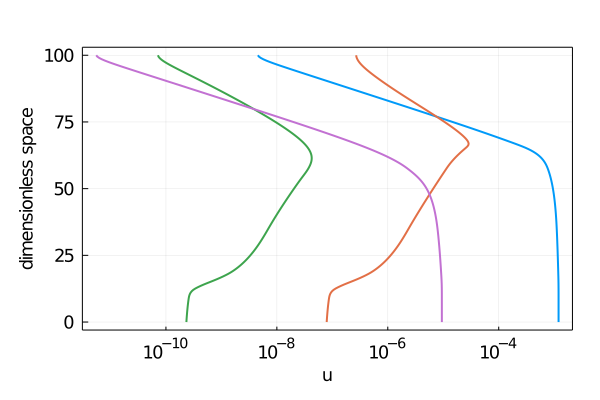

In [10]:
i = 12
plot(reshape(sol.u[1],(nq,nz))[i,:],range(0,stop=100,length=nz),lw=2.0,label="t = 0.0")
plot!(reshape(sol.u[1],(nq,nz))[61,:],range(0,stop=100,length=nz),lw=2.0,label="t = 0.0")
plot!(reshape(sol.u[end],(nq,nz))[61,:],range(0,stop=100,length=nz),lw=2.0,label="t = 0.0")
plot!(reshape(sol.u[end],(nq,nz))[i,:],range(0,stop=100,length=nz),lw=2.0,label="t = "*@sprintf("%5.3f",sol.t[end]))
plot!(legendfontsize = 12,xaxis=:log, guidefont = 12,tickfont=12,framestyle=:frame, margin=5Plots.mm,top_margin=10Plots.mm,
        legend = false)
ylabel!("dimensionless space")
xlabel!("u")

In [52]:
f = open("input/templates/Hadean+HCN/species.dat", "r")


species = Vector{String}()

i = 0

for line in readlines(f)
    first = split(line)[1]
#     println(first[1])
    if first[1]=='*'
        if i==1
            break
        end
    else
        i = 1
        push!(species,first)
    end
    
end


close(f)

In [48]:
species = Vector{String}()

String[]

In [53]:
species

69-element Vector{String}:
 "O"
 "O2"
 "H2O"
 "H"
 "OH"
 "HO2"
 "H2O2"
 "H2"
 "CO"
 "HCO"
 "H2CO"
 "CH4"
 "CH3"
 ⋮
 "HNCO"
 "NH3"
 "NH2"
 "HCN"
 "NCO"
 "CN"
 "N2H3"
 "N2H4"
 "SO4AER"
 "S8AER"
 "HCAER"
 "HCAER2"

In [57]:
font = Plots.font("DejaVu Sans", 12)

Plots.Font("DejaVu Sans", 12, :hcenter, :vcenter, 0.0, RGB{N0f8}(0.0,0.0,0.0))

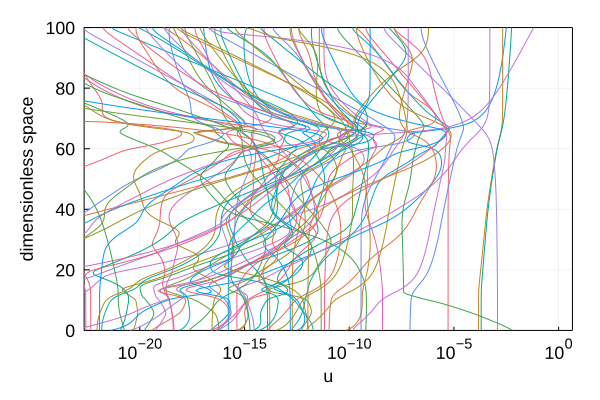

In [62]:
font = Plots.font("JuliaMono", 12)
plot()
for i in 1:nq
    plot!(reshape(sol.u[1],(nq,nz))[i,:],range(0,stop=100,length=nz),lw=1.0)
#     plot!(abs.(reshape(sol.u[end],(nq,nz))[i,:]),range(0,stop=100,length=nz),color=:red,lw=1.0,label="t = 0.0")
    plot!(legendfont =font,xaxis=:log,ylim=(0,100), 
        guidefont = font,tickfont=font,framestyle=:frame, margin=5Plots.mm,
            legend = false,xlim=[1e-22,1])
end

ylabel!("dimensionless space")
xlabel!("u")
# savefig("test.png")

In [14]:
Apercu Mono

ODESolution{Float64, 2, Vector{Vector{Float64}}, Nothing, Nothing, Vector{Float64}, Nothing, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, SciMLBase.NullParameters, ODEFunction{true, typeof(rhs!), UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing}, Base.Iterators.Pairs{Union{}, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}, SciMLBase.StandardODEProblem}, CVODE_BDF{:Newton, :Band, Nothing, Nothing}, SciMLBase.LinearInterpolation{Vector{Float64}, Vector{Vector{Float64}}}, DiffEqBase.DEStats}

┌ Info: Saved animation to 
│   fn = /Users/nicholas/Documents/Research_local/PhotochemPy/PhotochemPy/1-D_photochemistry_hadean2.gif
└ @ Plots /Users/nicholas/.julia/packages/Plots/z5Msu/src/animation.jl:104


Plots.AnimatedGif("/Users/nicholas/Documents/Research_local/PhotochemPy/PhotochemPy/1-D_photochemistry_hadean2.gif")
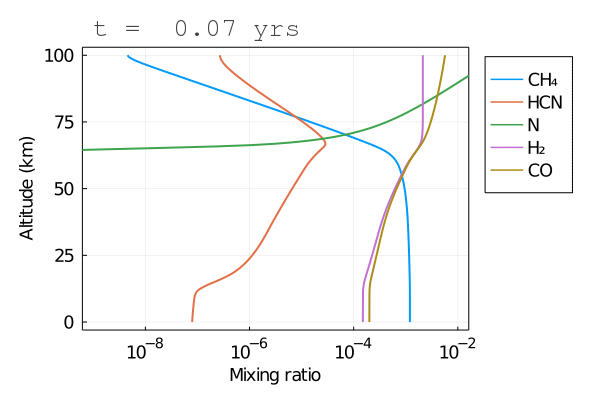

In [13]:
yr = 365*24*60*60
anim = @animate for i = 750:length(sol.u)
    plot(reshape(sol.u[i],(nq,nz))[12,:],range(0,stop=100,length=nz),lw=2.0,label="CH₄")
    plot!(reshape(sol.u[i],(nq,nz))[61,:],range(0,stop=100,length=nz),lw=2.0,label="HCN")
    plot!(reshape(sol.u[i],(nq,nz))[20,:],range(0,stop=100,length=nz),lw=2.0,label="N")
    plot!(reshape(sol.u[i],(nq,nz))[8,:],range(0,stop=100,length=nz),lw=2.0,label="H₂")
    plot!(reshape(sol.u[i],(nq,nz))[9,:],range(0,stop=100,length=nz),lw=2.0,label="CO")
    plot!(legendfontsize = 12,xaxis=:log, guidefont = 12,tickfont=12,framestyle=:frame, margin=5Plots.mm,
        legend = :outertopright,xlim=[1e-9,1e-2],top_margin=10Plots.mm)
    annotate!(1e-9, 110,Plots.text("t = "*@sprintf("%5.2f",sol.t[i]/yr)*" yrs", :left, "courier"))
    ylabel!("Altitude (km)")
    xlabel!("Mixing ratio")
end

gif(anim, "1-D_photochemistry_hadean2.gif", fps = 15)

In [30]:
yr = 365*24*60*60

31536000

In [36]:
sol.t[1360]/yr

11441.211985392569

In [78]:
import Pkg; Pkg.add("PlotlyJS")

    Updating registry at `~/.julia/registries/General`
    Updating git-repo `https://github.com/JuliaRegistries/General.git`
   Resolving package versions...
   Installed Kaleido_jll ─ v0.1.0+0
   Installed PlotlyBase ── v0.5.1
   Installed PlotlyJS ──── v0.14.1
   Installed Blink ─────── v0.12.5
    Updating `~/.julia/environments/v1.6/Project.toml`
  [f0f68f2c] + PlotlyJS v0.14.1
    Updating `~/.julia/environments/v1.6/Manifest.toml`
  [bf4720bc] + AssetRegistry v0.1.0
  [ad839575] + Blink v0.12.5
  [de31a74c] + FunctionalCollections v0.5.0
  [9fb69e20] + Hiccup v0.2.2
  [97c1335a] + JSExpr v0.5.2
  [50d2b5c4] + Lazy v0.15.1
  [ffc61752] + Mustache v1.0.10
  [a975b10e] + Mux v0.7.5
  [510215fc] + Observables v0.3.3
  [fa939f87] + Pidfile v1.2.0
  [a03496cd] + PlotlyBase v0.5.1
  [f0f68f2c] + PlotlyJS v0.14.1
  [0f1e0344] + WebIO v0.8.15
  [104b5d7c] + WebSockets v1.5.9
  [cc8bc4a8] + Widgets v0.6.2
  [f7e6163d] + Kaleido_jll v0.1.0+0
    Building Blink ───→ `~/.julia/scratchspaces/

In [ ]:
1360

In [84]:
gr()

Plots.GRBackend()

In [86]:
font = Plots.font("DejaVu Sans", 12)
yr = 365*24*60*60
anim = @animate for i = 1040:1360
    plot(abs.(reshape(sol.u[i],(nq,nz))[1,:]),range(0,stop=100,length=nz),lw=1.0)
    for j in 2:nq
        plot!(abs.(reshape(sol.u[i],(nq,nz))[j,:]),range(0,stop=100,length=nz),lw=1.0)
    end
    plot!(legendfont = font,xaxis=:log, guidefont = font,tickfont=font,framestyle=:frame, margin=5Plots.mm,
        legend = false,xlim=[1e-22,1e-2],ylim=(0,100),top_margin=10Plots.mm,dpi=200)
    annotate!(1e-22, 110,Plots.text("t = "*@sprintf("%5.2f",sol.t[i]/yr)*" yrs", :left, "Courier"))
    ylabel!("Altitude (km)")
    xlabel!("Mixing ratio")
end

gif(anim,"Archean_hazy2not.mp4", fps = 20)

┌ Info: Saved animation to 
│   fn = /Users/nicholas/Documents/Research_local/PhotochemPy/PhotochemPy/Archean_hazy2not.mp4
└ @ Plots /Users/nicholas/.julia/packages/Plots/z5Msu/src/animation.jl:104


Plots.AnimatedGif("/Users/nicholas/Documents/Research_local/PhotochemPy/PhotochemPy/Archean_hazy2not.mp4")

In [2]:
using FileIO
using JLD2
using JLD

In [27]:
# FileIO.save("hazy_to_not_Archean.jld2","sol",sol)


In [4]:
FileIO.save("hazy_to_not_Archean1.jld","sol",sol)

In [5]:
using Pkg
Pkg.add("NPZ")

    Updating registry at `~/.julia/registries/General`
    Updating git-repo `https://github.com/JuliaRegistries/General.git`
   Resolving package versions...
   Installed NPZ ───── v0.4.1
   Installed ZipFile ─ v0.9.3
    Updating `~/.julia/environments/v1.6/Project.toml`
  [15e1cf62] + NPZ v0.4.1
    Updating `~/.julia/environments/v1.6/Manifest.toml`
  [15e1cf62] + NPZ v0.4.1
  [a5390f91] + ZipFile v0.9.3
Precompiling project...
  ✓ ZipFile
  ✓ NPZ
2 dependencies successfully precompiled in 4 seconds (244 already precompiled)


In [6]:
using NPZ

In [37]:
npzwrite("sol.npy", out)

In [39]:
npzwrite("time.npy",sol.t)

In [15]:
out = zeros(Float64,(length(sol.t),69,200))

2000×69×200 Array{Float64, 3}:
[:, :, 1] =
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  

In [32]:

for i in 1:length(sol.t)
    out[i,:,:] .= reshape(sol.u[i],(69,200))
end

In [36]:
out

2000×69×200 Array{Float64, 3}:
[:, :, 1] =
 2.53144e-17  1.10239e-11  0.00629389  …  1.52969e-10  9.35317e-13
 2.54386e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.55616e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.56828e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.58025e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.59206e-17  1.10239e-11  0.00629389  …  1.52969e-10  9.35317e-13
 2.60372e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.61522e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.62655e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.63767e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.64862e-17  1.10239e-11  0.00629389  …  1.52969e-10  9.35317e-13
 2.65938e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 2.66995e-17  1.10239e-11  0.00629389     1.52969e-10  9.35317e-13
 ⋮                                     ⋱               
 9.87396e-15  1.0408e-9    0.0

In [10]:
sol = FileIO.load("hazy_to_not_Archean.jld2","sol");

┌ Warning: some parameters could not be resolved for type ODEFunction{true,Main.#rhs!,UniformScaling{Bool},Nothing,Nothing,Nothing,Nothing,Nothing,Nothing,Nothing,Nothing,Nothing,Nothing,Nothing,Nothing,typeof(SciMLBase.DEFAULT_OBSERVED),Nothing}; reconstructing
└ @ JLD2 /Users/nicholas/.julia/packages/JLD2/qncOK/src/data/reconstructing_datatypes.jl:440


In [ ]:
sprob = SteadyStateProblem(prob)
@time sols1 = solve(sprob,DynamicSS(CVODE_BDF(linear_solver=:Band,jac_upper=1,jac_lower=1)),dt=1.0e-10);

In [29]:
sol1

retcode: Success
Interpolation: 1st order linear
t: 2000-element Vector{Float64}:
 1.0
 1.0197747444901164
 1.0399405294998825
 1.060505087755659
 1.0814763048964957
 1.1028622224979392
 1.124671041155638
 1.146911123629924
 1.1695909980525783
 1.1927193611970084
 1.2163050818130943
 1.2403572040279784
 1.264884950814107
 ⋮
 8.062193670924488e16
 8.221621490796912e16
 8.384201955071862e16
 8.549997406486934e16
 8.719071420591362e16
 8.891488830124622e16
 9.067315749877053e16
 9.246619602042069e16
 9.42946914206982e16
 9.615934485031678e16
 9.806087132506869e16
 1.0e17
u: 2000-element Vector{Vector{Float64}}:
 [2.531437015633572e-17, 1.1023852659533512e-11, 0.006293888775141343, 4.5136198653981495e-17, 5.1273489553464674e-21, 7.406819487731013e-19, 4.443975355251274e-17, 0.00015, 0.0002, 4.221095193317011e-16  …  1.9216623048386846e-20, 2.689348114236269e-7, 2.6710980064804848e-21, 1.6976170244996342e-13, 1.2247557186443373e-34, 1.7878591326203196e-33, 8.134455725148266e-39, 7.836458735

In [42]:
a = cglobal((:__photochem_MOD_p0, "./Photochem_jl.so"), Float64)
b = unsafe_load(a)

0x68

In [68]:
a

Ptr{Float32} @0x00000001552ca240

In [71]:
usol = unsafe_wrap(Array,a,1000);

In [72]:
usol

1000-element Vector{Float64}:
 1.0994784721049049e12
 6.068287888953874e10
 2.827557381988688e10
 3.535562227591801e10
 4.79644586679075e10
 8.806164437204999e10
 1.0954350117051874e11
 1.5085071182740002e11
 2.2745010628481622e11
 3.630585355652977e11
 1.6437551474721246e11
 2.05852706337525e11
 2.2179040256337704e11
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [2]:
str = "hi"
ccall((:pass_str_, "./test.so"), 
    Cvoid, (Ptr{UInt8},Csize_t), str, sizeof(str))

Bool